In [1]:
import random
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils

In [2]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML
%matplotlib inline

In [3]:
manualSeed = random.randint(1, 10000) 
print("Random Seed: ", manualSeed)
random.seed(manualSeed)
torch.manual_seed(manualSeed)

Random Seed:  7283


In [4]:
# Number of workers for dataloader
workers = 4

batch_size = 128

image_size = 64

# Number of channels in the training imgs
nc = 3

# Size of z latent vector
nz = 100

# Size of feature maps in generator
ngf = 64

# Size of feature maps in discriminator
ndf = 64

num_epochs = 5
lr = 0.0002

# Beta1 hyperparam for Adam optimizers
beta1 = 0.5

# Number of GPUs
ngpu = 1

# Download data

In [5]:
from google_drive_downloader import GoogleDriveDownloaderriveDownloader as gdd

ImportError: cannot import name 'GoogleDriveDownloaderriveDownloader'

In [8]:
gdd.download_file_from_google_drive(file_id='0B7EVK8r0v71pZjFTYXZWM3FlRnM',
                                    dest_path='./data/img_align_celeba.zip',
                                    unzip=True)
# delete zip
!rm ./data/img_align_celeba.zip

Unzipping...Done.


In [6]:
dataroot = 'data'

In [7]:
tr = transforms.Compose([
                               transforms.Resize(image_size),
                               transforms.CenterCrop(image_size),
                               transforms.ToTensor(),
                               transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
                           ])

In [8]:
dataset = dset.ImageFolder(root=dataroot, transform=tr)

In [9]:
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size, shuffle=True, num_workers=workers)

In [10]:
device = torch.device("cuda:0")

In [11]:
def imshow(imgs):
    if imgs.shape[0] > 64:
        imgs = imgs[:64]
    gridTensor = vutils.make_grid(imgs, padding=2, normalize=True)
    npArray = np.transpose(gridTensor, (1,2,0))
    plt.figure(figsize=(8,8))
    plt.axis("off")
    plt.title("Training Images")
    plt.imshow(npArray)
    plt.show()

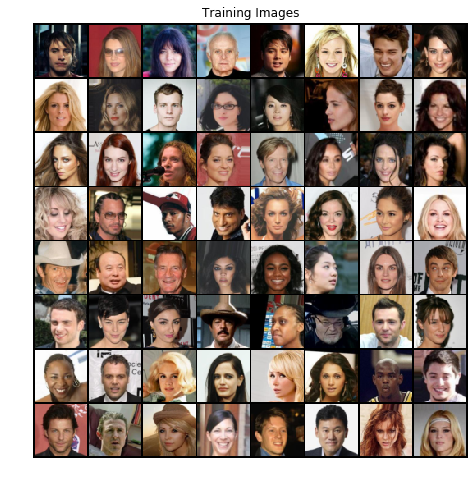

In [12]:
# Plot some training images
real_batch = next(iter(dataloader))

imshow(real_batch[0])

In [13]:
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)

In [14]:
# Generator
class Generator(nn.Module):
    def __init__(self, ngpu):
        super(Generator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # nz x 1 x 1
            nn.ConvTranspose2d( nz, ngf * 8, 4, 1, 0, bias=False),
            nn.BatchNorm2d(ngf * 8),
            nn.ReLU(True),
            # state size. (ngf*8) x 4 x 4
            nn.ConvTranspose2d(ngf * 8, ngf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 4),
            nn.ReLU(True),
            # state size. (ngf*4) x 8 x 8
            nn.ConvTranspose2d( ngf * 4, ngf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf * 2),
            nn.ReLU(True),
            # state size. (ngf*2) x 16 x 16
            nn.ConvTranspose2d( ngf * 2, ngf, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ngf),
            nn.ReLU(True),
            # state size. (ngf) x 32 x 32
            nn.ConvTranspose2d( ngf, nc, 4, 2, 1, bias=False),
            nn.Tanh()
            # state size. (nc) x 64 x 64
        )

    def forward(self, input):
        return self.main(input)

In [15]:
netG = Generator(ngpu).to(device)
netG.apply(weights_init)
print(netG)

Generator(
  (main): Sequential(
    (0): ConvTranspose2d(100, 512, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU(inplace)
    (3): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU(inplace)
    (6): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (7): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (8): ReLU(inplace)
    (9): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (10): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (11): ReLU(inplace)
    (12): ConvTranspose2d(64, 3, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (13): Tanh()
  )
)


In [16]:
# Discriminator
class Discriminator(nn.Module):
    def __init__(self, ngpu):
        super(Discriminator, self).__init__()
        self.ngpu = ngpu
        self.main = nn.Sequential(
            # input is (nc) x 64 x 64
            nn.Conv2d(nc, ndf, 4, 2, 1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf) x 32 x 32
            nn.Conv2d(ndf, ndf * 2, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 2),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*2) x 16 x 16
            nn.Conv2d(ndf * 2, ndf * 4, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 4),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*4) x 8 x 8
            nn.Conv2d(ndf * 4, ndf * 8, 4, 2, 1, bias=False),
            nn.BatchNorm2d(ndf * 8),
            nn.LeakyReLU(0.2, inplace=True),
            # state size. (ndf*8) x 4 x 4
            nn.Conv2d(ndf * 8, 1, 4, 1, 0, bias=False),
            nn.Sigmoid()
        )

    def forward(self, input):
        return self.main(input)


In [17]:
netD = Discriminator(ngpu).to(device)
netD.apply(weights_init)
print(netD)

Discriminator(
  (main): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace)
    (11): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (12): Sigmoid()
  )
)


In [18]:
criterion = nn.BCELoss()

# Create batch of latent vectors that we will use to visualize
fixed_noise = torch.randn(64, nz, 1, 1, device=device)

real_label = 1
fake_label = 0

In [19]:
optimizerD = optim.Adam(netD.parameters(), lr=lr, betas=(beta1, 0.999))
optimizerG = optim.Adam(netG.parameters(), lr=lr, betas=(beta1, 0.999))

# Training Loop

[0/5][0/1583]	Loss_D: 1.5981	Loss_G: 7.2216	D(x): 0.7738	D(G(z)): 0.6658 / 0.0013


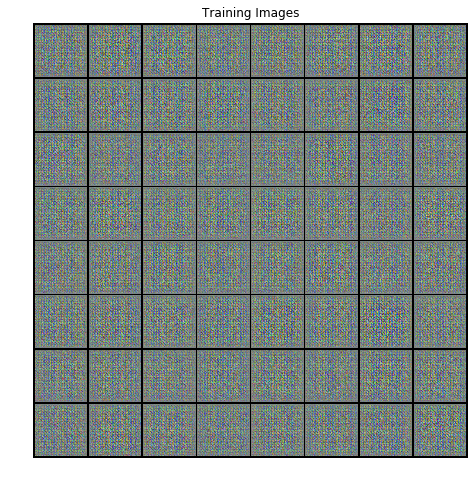

[0/5][50/1583]	Loss_D: 0.3490	Loss_G: 8.8868	D(x): 0.9628	D(G(z)): 0.1811 / 0.0004
[0/5][100/1583]	Loss_D: 0.4674	Loss_G: 11.3516	D(x): 0.9584	D(G(z)): 0.2961 / 0.0001
[0/5][150/1583]	Loss_D: 2.6780	Loss_G: 12.8188	D(x): 0.9923	D(G(z)): 0.8956 / 0.0000
[0/5][200/1583]	Loss_D: 0.8020	Loss_G: 3.3710	D(x): 0.5497	D(G(z)): 0.0322 / 0.0755
[0/5][250/1583]	Loss_D: 0.5298	Loss_G: 4.2649	D(x): 0.7323	D(G(z)): 0.0912 / 0.0248
[0/5][300/1583]	Loss_D: 0.6242	Loss_G: 6.3330	D(x): 0.8365	D(G(z)): 0.2826 / 0.0029
[0/5][350/1583]	Loss_D: 1.3398	Loss_G: 9.6504	D(x): 0.9392	D(G(z)): 0.6381 / 0.0004
[0/5][400/1583]	Loss_D: 0.4700	Loss_G: 3.7228	D(x): 0.7395	D(G(z)): 0.0590 / 0.0481
[0/5][450/1583]	Loss_D: 0.2271	Loss_G: 4.5233	D(x): 0.8998	D(G(z)): 0.0896 / 0.0238
[0/5][500/1583]	Loss_D: 0.4657	Loss_G: 4.2329	D(x): 0.7911	D(G(z)): 0.0990 / 0.0250


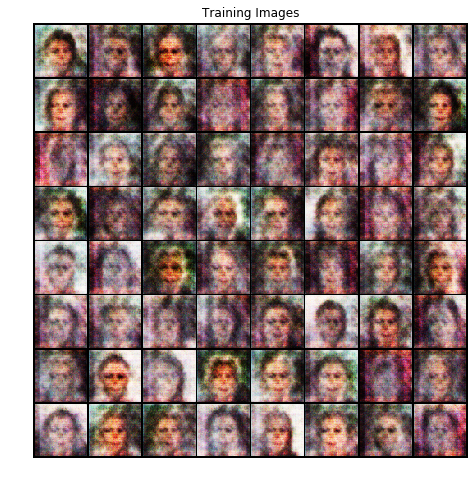

[0/5][550/1583]	Loss_D: 1.4824	Loss_G: 9.0650	D(x): 0.9290	D(G(z)): 0.6632 / 0.0008
[0/5][600/1583]	Loss_D: 1.7759	Loss_G: 9.2294	D(x): 0.9490	D(G(z)): 0.7105 / 0.0014
[0/5][650/1583]	Loss_D: 0.6139	Loss_G: 3.7964	D(x): 0.6715	D(G(z)): 0.0605 / 0.0405
[0/5][700/1583]	Loss_D: 0.1808	Loss_G: 5.2592	D(x): 0.9096	D(G(z)): 0.0661 / 0.0084
[0/5][750/1583]	Loss_D: 0.5608	Loss_G: 4.9067	D(x): 0.6897	D(G(z)): 0.0367 / 0.0169
[0/5][800/1583]	Loss_D: 0.5591	Loss_G: 3.6096	D(x): 0.7804	D(G(z)): 0.2084 / 0.0416
[0/5][850/1583]	Loss_D: 1.1652	Loss_G: 3.0153	D(x): 0.4722	D(G(z)): 0.0100 / 0.1136
[0/5][900/1583]	Loss_D: 0.6502	Loss_G: 3.7623	D(x): 0.6405	D(G(z)): 0.0465 / 0.0628
[0/5][950/1583]	Loss_D: 0.4629	Loss_G: 4.0447	D(x): 0.7832	D(G(z)): 0.1096 / 0.0377
[0/5][1000/1583]	Loss_D: 0.4545	Loss_G: 4.3306	D(x): 0.8766	D(G(z)): 0.2260 / 0.0210


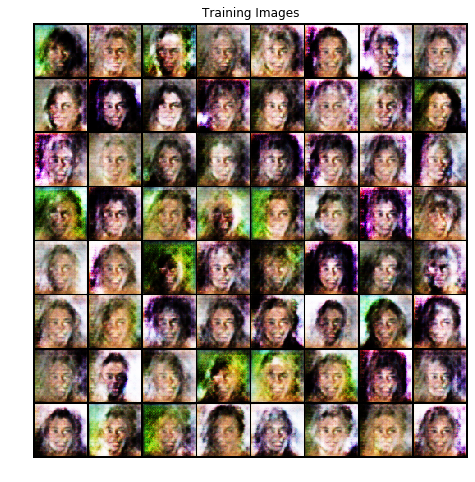

[0/5][1050/1583]	Loss_D: 0.7271	Loss_G: 5.2365	D(x): 0.9286	D(G(z)): 0.4013 / 0.0125
[0/5][1100/1583]	Loss_D: 0.4362	Loss_G: 4.3102	D(x): 0.8806	D(G(z)): 0.2264 / 0.0232
[0/5][1150/1583]	Loss_D: 0.6056	Loss_G: 6.1478	D(x): 0.9072	D(G(z)): 0.3335 / 0.0056
[0/5][1200/1583]	Loss_D: 0.4109	Loss_G: 5.6257	D(x): 0.9015	D(G(z)): 0.2288 / 0.0072
[0/5][1250/1583]	Loss_D: 0.5666	Loss_G: 2.8997	D(x): 0.7362	D(G(z)): 0.1564 / 0.0813
[0/5][1300/1583]	Loss_D: 0.4747	Loss_G: 3.3926	D(x): 0.7070	D(G(z)): 0.0366 / 0.0756
[0/5][1350/1583]	Loss_D: 0.3139	Loss_G: 4.0776	D(x): 0.8283	D(G(z)): 0.0703 / 0.0293
[0/5][1400/1583]	Loss_D: 0.9427	Loss_G: 7.1883	D(x): 0.9743	D(G(z)): 0.5118 / 0.0018
[0/5][1450/1583]	Loss_D: 1.1417	Loss_G: 7.4878	D(x): 0.9526	D(G(z)): 0.5657 / 0.0018
[0/5][1500/1583]	Loss_D: 0.3585	Loss_G: 3.8601	D(x): 0.8144	D(G(z)): 0.0916 / 0.0368


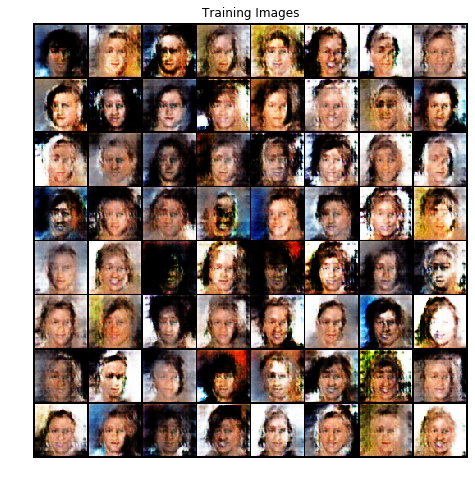

[0/5][1550/1583]	Loss_D: 0.7682	Loss_G: 5.4478	D(x): 0.9015	D(G(z)): 0.4147 / 0.0090
[1/5][0/1583]	Loss_D: 0.5363	Loss_G: 5.3913	D(x): 0.9210	D(G(z)): 0.3170 / 0.0078
[1/5][50/1583]	Loss_D: 3.0581	Loss_G: 1.3318	D(x): 0.1038	D(G(z)): 0.0020 / 0.3402
[1/5][100/1583]	Loss_D: 0.3348	Loss_G: 4.1076	D(x): 0.8739	D(G(z)): 0.1522 / 0.0277
[1/5][150/1583]	Loss_D: 0.2976	Loss_G: 3.4755	D(x): 0.8454	D(G(z)): 0.0999 / 0.0461
[1/5][200/1583]	Loss_D: 0.6034	Loss_G: 4.2109	D(x): 0.8362	D(G(z)): 0.2920 / 0.0208
[1/5][250/1583]	Loss_D: 0.7183	Loss_G: 4.0004	D(x): 0.8078	D(G(z)): 0.3223 / 0.0434
[1/5][300/1583]	Loss_D: 0.4914	Loss_G: 2.5152	D(x): 0.7195	D(G(z)): 0.0693 / 0.1306
[1/5][350/1583]	Loss_D: 0.3464	Loss_G: 3.4783	D(x): 0.8648	D(G(z)): 0.1509 / 0.0462
[1/5][400/1583]	Loss_D: 0.5816	Loss_G: 2.1488	D(x): 0.6861	D(G(z)): 0.1173 / 0.1762


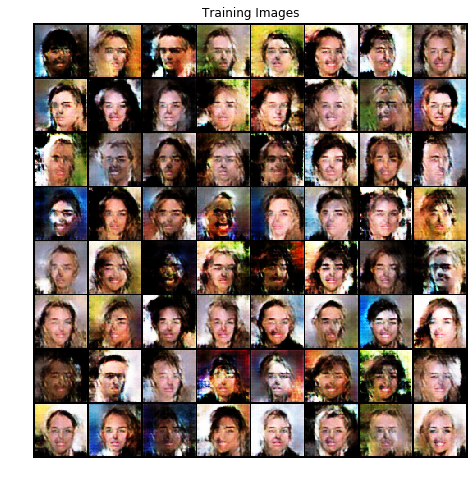

[1/5][450/1583]	Loss_D: 0.8069	Loss_G: 5.8288	D(x): 0.9517	D(G(z)): 0.4512 / 0.0081
[1/5][500/1583]	Loss_D: 0.4910	Loss_G: 3.4403	D(x): 0.8231	D(G(z)): 0.1967 / 0.0520
[1/5][550/1583]	Loss_D: 0.8991	Loss_G: 6.1907	D(x): 0.9373	D(G(z)): 0.5186 / 0.0041
[1/5][600/1583]	Loss_D: 0.5756	Loss_G: 3.9068	D(x): 0.8272	D(G(z)): 0.2702 / 0.0293
[1/5][650/1583]	Loss_D: 0.4050	Loss_G: 2.9627	D(x): 0.8130	D(G(z)): 0.1476 / 0.0733
[1/5][700/1583]	Loss_D: 0.6018	Loss_G: 2.3807	D(x): 0.7540	D(G(z)): 0.1984 / 0.1305
[1/5][750/1583]	Loss_D: 0.7859	Loss_G: 2.0428	D(x): 0.5599	D(G(z)): 0.0271 / 0.1800
[1/5][800/1583]	Loss_D: 0.8364	Loss_G: 1.4795	D(x): 0.5649	D(G(z)): 0.0694 / 0.3027
[1/5][850/1583]	Loss_D: 0.4037	Loss_G: 3.4534	D(x): 0.9003	D(G(z)): 0.2274 / 0.0483
[1/5][900/1583]	Loss_D: 0.6417	Loss_G: 4.4609	D(x): 0.8350	D(G(z)): 0.3162 / 0.0197


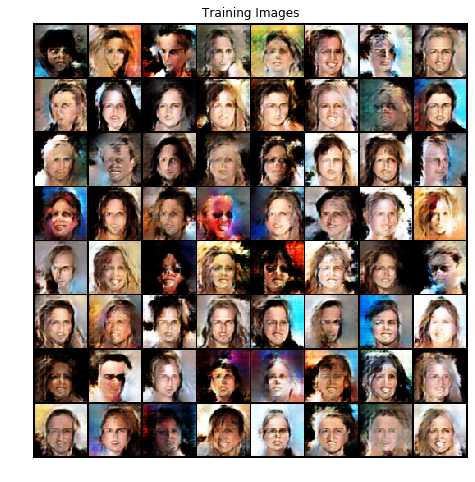

[1/5][950/1583]	Loss_D: 0.6602	Loss_G: 1.6116	D(x): 0.6360	D(G(z)): 0.0917 / 0.2577
[1/5][1000/1583]	Loss_D: 1.5523	Loss_G: 1.6164	D(x): 0.2937	D(G(z)): 0.0030 / 0.2894
[1/5][1050/1583]	Loss_D: 1.3014	Loss_G: 6.5035	D(x): 0.9745	D(G(z)): 0.6409 / 0.0044
[1/5][1100/1583]	Loss_D: 0.5089	Loss_G: 2.2249	D(x): 0.7461	D(G(z)): 0.1391 / 0.1460
[1/5][1150/1583]	Loss_D: 0.5975	Loss_G: 2.4315	D(x): 0.6632	D(G(z)): 0.0990 / 0.1373
[1/5][1200/1583]	Loss_D: 0.3401	Loss_G: 3.2306	D(x): 0.9147	D(G(z)): 0.2011 / 0.0571
[1/5][1250/1583]	Loss_D: 0.7753	Loss_G: 5.2246	D(x): 0.9593	D(G(z)): 0.4583 / 0.0114
[1/5][1300/1583]	Loss_D: 0.6458	Loss_G: 2.9945	D(x): 0.7634	D(G(z)): 0.2565 / 0.0747
[1/5][1350/1583]	Loss_D: 0.4646	Loss_G: 2.0268	D(x): 0.7663	D(G(z)): 0.1396 / 0.1729
[1/5][1400/1583]	Loss_D: 0.4619	Loss_G: 3.5057	D(x): 0.9100	D(G(z)): 0.2727 / 0.0427


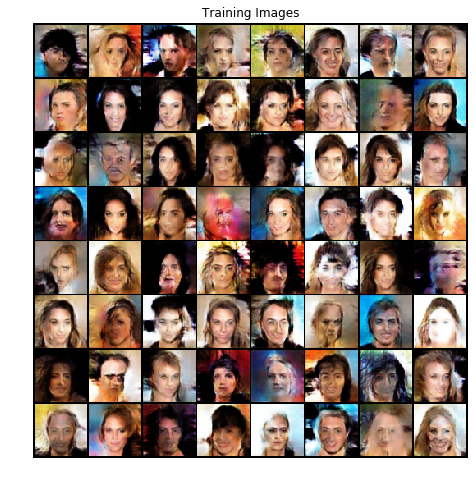

[1/5][1450/1583]	Loss_D: 0.4828	Loss_G: 2.1918	D(x): 0.7619	D(G(z)): 0.1410 / 0.1500
[1/5][1500/1583]	Loss_D: 0.4403	Loss_G: 3.0772	D(x): 0.7725	D(G(z)): 0.1331 / 0.0671
[1/5][1550/1583]	Loss_D: 0.3720	Loss_G: 3.4282	D(x): 0.8391	D(G(z)): 0.1478 / 0.0533
[2/5][0/1583]	Loss_D: 0.4810	Loss_G: 2.3882	D(x): 0.7578	D(G(z)): 0.1348 / 0.1266
[2/5][50/1583]	Loss_D: 0.4506	Loss_G: 2.9435	D(x): 0.8207	D(G(z)): 0.1910 / 0.0747
[2/5][100/1583]	Loss_D: 1.1745	Loss_G: 4.9748	D(x): 0.9294	D(G(z)): 0.5908 / 0.0132
[2/5][150/1583]	Loss_D: 0.7621	Loss_G: 1.4533	D(x): 0.5675	D(G(z)): 0.0758 / 0.2907
[2/5][200/1583]	Loss_D: 0.5653	Loss_G: 1.8974	D(x): 0.7371	D(G(z)): 0.1901 / 0.1877
[2/5][250/1583]	Loss_D: 0.5751	Loss_G: 1.8749	D(x): 0.6862	D(G(z)): 0.1344 / 0.1914
[2/5][300/1583]	Loss_D: 0.6748	Loss_G: 0.9035	D(x): 0.6166	D(G(z)): 0.1121 / 0.4467


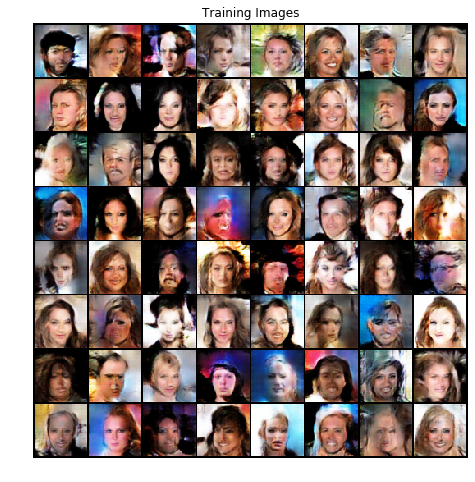

[2/5][350/1583]	Loss_D: 1.3227	Loss_G: 1.4280	D(x): 0.3765	D(G(z)): 0.0312 / 0.3094
[2/5][400/1583]	Loss_D: 1.2595	Loss_G: 0.8264	D(x): 0.3880	D(G(z)): 0.1253 / 0.5009
[2/5][450/1583]	Loss_D: 0.5857	Loss_G: 1.6576	D(x): 0.6681	D(G(z)): 0.1063 / 0.2362
[2/5][500/1583]	Loss_D: 0.5371	Loss_G: 2.2996	D(x): 0.8309	D(G(z)): 0.2680 / 0.1276
[2/5][550/1583]	Loss_D: 1.0955	Loss_G: 4.2870	D(x): 0.9022	D(G(z)): 0.5469 / 0.0226
[2/5][600/1583]	Loss_D: 0.6799	Loss_G: 1.3458	D(x): 0.5980	D(G(z)): 0.0821 / 0.3034
[2/5][650/1583]	Loss_D: 1.5282	Loss_G: 5.0486	D(x): 0.9426	D(G(z)): 0.6855 / 0.0098
[2/5][700/1583]	Loss_D: 2.3235	Loss_G: 0.4167	D(x): 0.1715	D(G(z)): 0.0430 / 0.7017
[2/5][750/1583]	Loss_D: 0.9729	Loss_G: 2.1349	D(x): 0.4556	D(G(z)): 0.0463 / 0.1550
[2/5][800/1583]	Loss_D: 0.6347	Loss_G: 2.6137	D(x): 0.7450	D(G(z)): 0.2404 / 0.0978


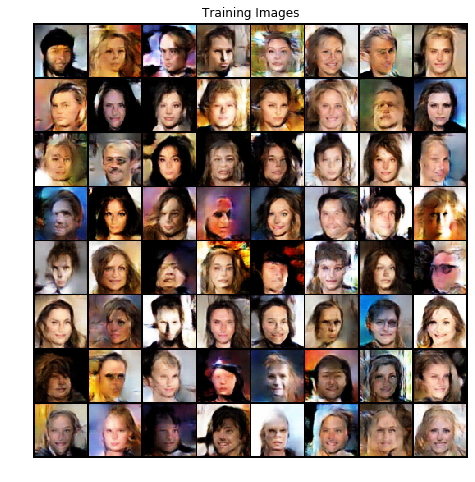

[2/5][850/1583]	Loss_D: 0.5550	Loss_G: 2.6755	D(x): 0.8720	D(G(z)): 0.3107 / 0.0905
[2/5][900/1583]	Loss_D: 0.6665	Loss_G: 1.9223	D(x): 0.6368	D(G(z)): 0.1042 / 0.1814
[2/5][950/1583]	Loss_D: 0.5890	Loss_G: 1.8272	D(x): 0.7029	D(G(z)): 0.1598 / 0.1953
[2/5][1000/1583]	Loss_D: 0.5538	Loss_G: 3.1426	D(x): 0.8913	D(G(z)): 0.3256 / 0.0568
[2/5][1050/1583]	Loss_D: 0.6306	Loss_G: 1.4893	D(x): 0.6656	D(G(z)): 0.1253 / 0.2709
[2/5][1100/1583]	Loss_D: 1.1693	Loss_G: 1.4503	D(x): 0.3903	D(G(z)): 0.0524 / 0.2962
[2/5][1150/1583]	Loss_D: 0.5152	Loss_G: 2.4247	D(x): 0.8259	D(G(z)): 0.2454 / 0.1148
[2/5][1200/1583]	Loss_D: 1.8002	Loss_G: 0.3419	D(x): 0.2170	D(G(z)): 0.0284 / 0.7362
[2/5][1250/1583]	Loss_D: 1.5391	Loss_G: 1.2412	D(x): 0.3072	D(G(z)): 0.0204 / 0.3537
[2/5][1300/1583]	Loss_D: 0.5422	Loss_G: 2.0016	D(x): 0.7599	D(G(z)): 0.1961 / 0.1689


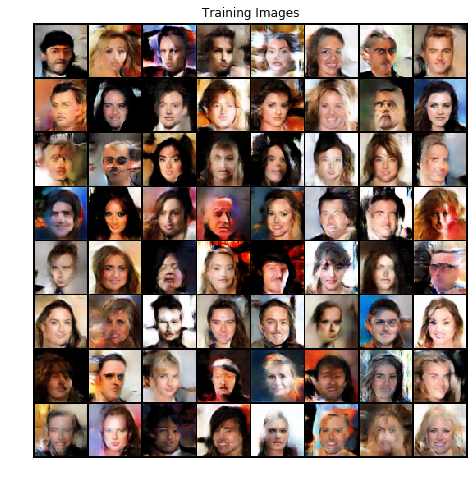

[2/5][1350/1583]	Loss_D: 0.5760	Loss_G: 2.5460	D(x): 0.7579	D(G(z)): 0.2151 / 0.1048
[2/5][1400/1583]	Loss_D: 1.0651	Loss_G: 0.5937	D(x): 0.4179	D(G(z)): 0.0562 / 0.5963
[2/5][1450/1583]	Loss_D: 0.6748	Loss_G: 2.3220	D(x): 0.6342	D(G(z)): 0.1210 / 0.1392
[2/5][1500/1583]	Loss_D: 1.1028	Loss_G: 1.6728	D(x): 0.4260	D(G(z)): 0.0593 / 0.2325
[2/5][1550/1583]	Loss_D: 0.5096	Loss_G: 2.2199	D(x): 0.7265	D(G(z)): 0.1321 / 0.1443
[3/5][0/1583]	Loss_D: 0.6213	Loss_G: 1.7724	D(x): 0.7103	D(G(z)): 0.1937 / 0.2095
[3/5][50/1583]	Loss_D: 0.5878	Loss_G: 2.9417	D(x): 0.8161	D(G(z)): 0.2882 / 0.0698
[3/5][100/1583]	Loss_D: 0.9792	Loss_G: 3.2253	D(x): 0.8395	D(G(z)): 0.4870 / 0.0619
[3/5][150/1583]	Loss_D: 0.6356	Loss_G: 1.6122	D(x): 0.6562	D(G(z)): 0.1486 / 0.2370
[3/5][200/1583]	Loss_D: 0.6183	Loss_G: 3.0661	D(x): 0.8714	D(G(z)): 0.3447 / 0.0588
[3/5][250/1583]	Loss_D: 0.4887	Loss_G: 2.3800	D(x): 0.8317	D(G(z)): 0.2403 / 0.1129


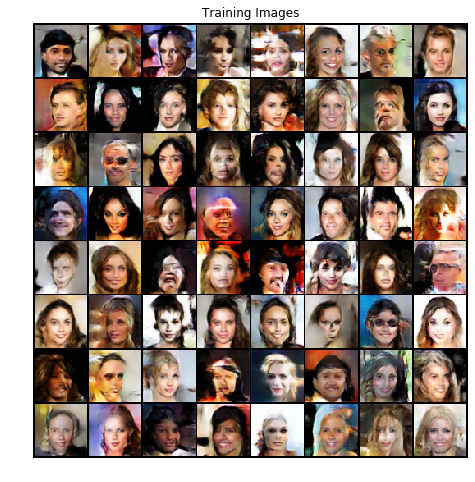

[3/5][300/1583]	Loss_D: 0.9754	Loss_G: 1.0418	D(x): 0.4648	D(G(z)): 0.0529 / 0.4170
[3/5][350/1583]	Loss_D: 0.5506	Loss_G: 2.1642	D(x): 0.7830	D(G(z)): 0.2276 / 0.1448
[3/5][400/1583]	Loss_D: 0.8657	Loss_G: 3.4344	D(x): 0.9307	D(G(z)): 0.4935 / 0.0449
[3/5][450/1583]	Loss_D: 0.7011	Loss_G: 2.7427	D(x): 0.8115	D(G(z)): 0.3479 / 0.0853
[3/5][500/1583]	Loss_D: 0.9933	Loss_G: 1.2439	D(x): 0.4887	D(G(z)): 0.0958 / 0.3486
[3/5][550/1583]	Loss_D: 0.5262	Loss_G: 2.3797	D(x): 0.8093	D(G(z)): 0.2445 / 0.1124
[3/5][600/1583]	Loss_D: 1.3372	Loss_G: 1.0552	D(x): 0.3443	D(G(z)): 0.0458 / 0.4006
[3/5][650/1583]	Loss_D: 0.6501	Loss_G: 2.5704	D(x): 0.7488	D(G(z)): 0.2621 / 0.0982
[3/5][700/1583]	Loss_D: 0.9929	Loss_G: 4.7682	D(x): 0.9250	D(G(z)): 0.5468 / 0.0113
[3/5][750/1583]	Loss_D: 0.7002	Loss_G: 1.7964	D(x): 0.5924	D(G(z)): 0.0845 / 0.2121


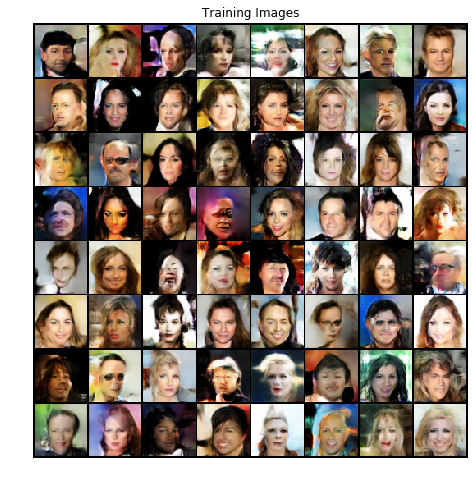

[3/5][800/1583]	Loss_D: 0.5747	Loss_G: 1.7487	D(x): 0.6983	D(G(z)): 0.1530 / 0.2063
[3/5][850/1583]	Loss_D: 0.6679	Loss_G: 2.6204	D(x): 0.8241	D(G(z)): 0.3113 / 0.0975
[3/5][900/1583]	Loss_D: 0.6684	Loss_G: 1.5640	D(x): 0.6168	D(G(z)): 0.0987 / 0.2475
[3/5][950/1583]	Loss_D: 0.7964	Loss_G: 1.6348	D(x): 0.5356	D(G(z)): 0.0410 / 0.2349
[3/5][1000/1583]	Loss_D: 4.2282	Loss_G: 5.2891	D(x): 0.9836	D(G(z)): 0.9621 / 0.0110
[3/5][1050/1583]	Loss_D: 2.3088	Loss_G: 0.5633	D(x): 0.1490	D(G(z)): 0.0170 / 0.6223
[3/5][1100/1583]	Loss_D: 0.9266	Loss_G: 3.9546	D(x): 0.8471	D(G(z)): 0.4918 / 0.0247
[3/5][1150/1583]	Loss_D: 0.9528	Loss_G: 1.1994	D(x): 0.4873	D(G(z)): 0.0747 / 0.3543
[3/5][1200/1583]	Loss_D: 0.7823	Loss_G: 3.7695	D(x): 0.9308	D(G(z)): 0.4575 / 0.0330
[3/5][1250/1583]	Loss_D: 0.8782	Loss_G: 4.4703	D(x): 0.8730	D(G(z)): 0.4718 / 0.0186


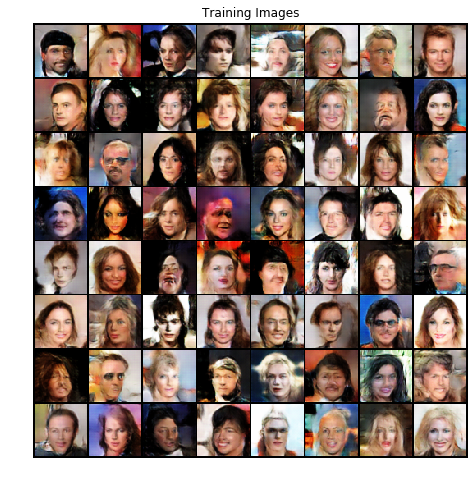

[3/5][1300/1583]	Loss_D: 0.6237	Loss_G: 1.4837	D(x): 0.6779	D(G(z)): 0.1681 / 0.2700
[3/5][1350/1583]	Loss_D: 0.4828	Loss_G: 2.8074	D(x): 0.8122	D(G(z)): 0.2176 / 0.0787
[3/5][1400/1583]	Loss_D: 0.5102	Loss_G: 2.7302	D(x): 0.8334	D(G(z)): 0.2547 / 0.0820
[3/5][1450/1583]	Loss_D: 1.8709	Loss_G: 0.2589	D(x): 0.2270	D(G(z)): 0.0176 / 0.7903
[3/5][1500/1583]	Loss_D: 0.4759	Loss_G: 3.3057	D(x): 0.8714	D(G(z)): 0.2618 / 0.0497
[3/5][1550/1583]	Loss_D: 0.5043	Loss_G: 3.5013	D(x): 0.8431	D(G(z)): 0.2510 / 0.0424
[4/5][0/1583]	Loss_D: 0.7311	Loss_G: 1.3550	D(x): 0.5846	D(G(z)): 0.0969 / 0.3128
[4/5][50/1583]	Loss_D: 0.7846	Loss_G: 4.2489	D(x): 0.9367	D(G(z)): 0.4684 / 0.0194
[4/5][100/1583]	Loss_D: 0.5840	Loss_G: 3.0624	D(x): 0.7954	D(G(z)): 0.2690 / 0.0591
[4/5][150/1583]	Loss_D: 0.5587	Loss_G: 2.4477	D(x): 0.7891	D(G(z)): 0.2355 / 0.1126


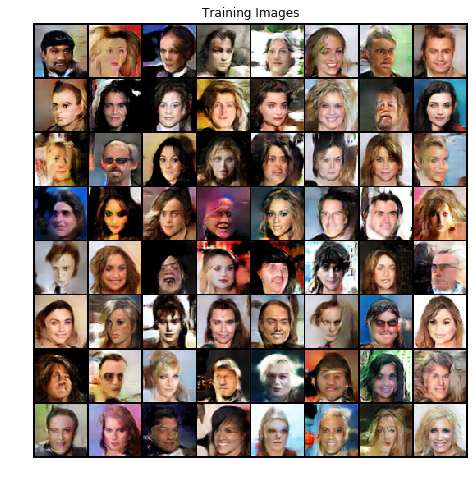

[4/5][200/1583]	Loss_D: 0.8473	Loss_G: 5.1915	D(x): 0.8931	D(G(z)): 0.4685 / 0.0076
[4/5][250/1583]	Loss_D: 0.6229	Loss_G: 3.6574	D(x): 0.9021	D(G(z)): 0.3671 / 0.0352
[4/5][300/1583]	Loss_D: 0.7046	Loss_G: 3.7079	D(x): 0.8910	D(G(z)): 0.4021 / 0.0355
[4/5][350/1583]	Loss_D: 0.9467	Loss_G: 0.9905	D(x): 0.5108	D(G(z)): 0.1436 / 0.4066
[4/5][400/1583]	Loss_D: 0.7683	Loss_G: 2.7047	D(x): 0.7989	D(G(z)): 0.3669 / 0.0844
[4/5][450/1583]	Loss_D: 0.5159	Loss_G: 1.9322	D(x): 0.7333	D(G(z)): 0.1472 / 0.1801
[4/5][500/1583]	Loss_D: 0.5650	Loss_G: 2.1987	D(x): 0.8159	D(G(z)): 0.2651 / 0.1391
[4/5][550/1583]	Loss_D: 1.5040	Loss_G: 0.7940	D(x): 0.2760	D(G(z)): 0.0238 / 0.5072
[4/5][600/1583]	Loss_D: 0.5577	Loss_G: 2.9785	D(x): 0.8928	D(G(z)): 0.3268 / 0.0629
[4/5][650/1583]	Loss_D: 0.6617	Loss_G: 2.3813	D(x): 0.7732	D(G(z)): 0.2869 / 0.1223


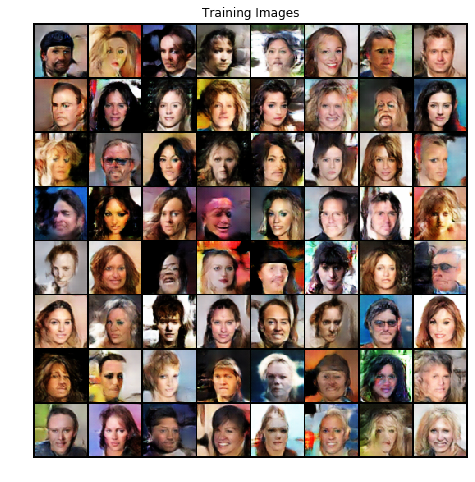

[4/5][700/1583]	Loss_D: 0.4766	Loss_G: 3.2739	D(x): 0.8320	D(G(z)): 0.2279 / 0.0520
[4/5][750/1583]	Loss_D: 0.7201	Loss_G: 3.2838	D(x): 0.8251	D(G(z)): 0.3688 / 0.0536
[4/5][800/1583]	Loss_D: 1.6341	Loss_G: 0.9874	D(x): 0.2914	D(G(z)): 0.0515 / 0.4439
[4/5][850/1583]	Loss_D: 0.6199	Loss_G: 1.7137	D(x): 0.7012	D(G(z)): 0.2022 / 0.2108
[4/5][900/1583]	Loss_D: 0.5111	Loss_G: 2.1339	D(x): 0.7266	D(G(z)): 0.1403 / 0.1463
[4/5][950/1583]	Loss_D: 1.2638	Loss_G: 4.8800	D(x): 0.9554	D(G(z)): 0.6455 / 0.0108
[4/5][1000/1583]	Loss_D: 0.8414	Loss_G: 4.0181	D(x): 0.8696	D(G(z)): 0.4462 / 0.0271
[4/5][1050/1583]	Loss_D: 0.5269	Loss_G: 3.4527	D(x): 0.8576	D(G(z)): 0.2771 / 0.0448
[4/5][1100/1583]	Loss_D: 0.5268	Loss_G: 1.7624	D(x): 0.7655	D(G(z)): 0.1950 / 0.2089
[4/5][1150/1583]	Loss_D: 0.5853	Loss_G: 2.0918	D(x): 0.7352	D(G(z)): 0.1978 / 0.1585


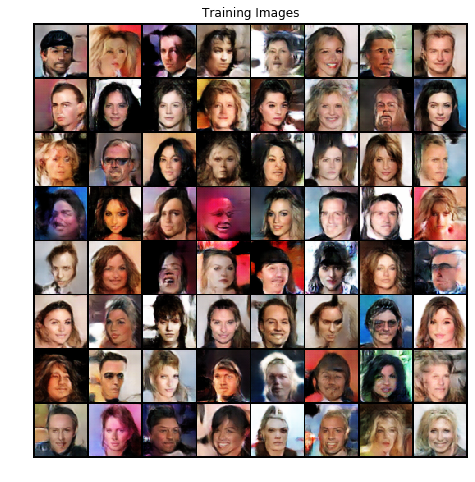

[4/5][1200/1583]	Loss_D: 0.6548	Loss_G: 1.8906	D(x): 0.6143	D(G(z)): 0.0990 / 0.2036
[4/5][1250/1583]	Loss_D: 0.4953	Loss_G: 2.8812	D(x): 0.8505	D(G(z)): 0.2576 / 0.0694
[4/5][1300/1583]	Loss_D: 0.6007	Loss_G: 2.1367	D(x): 0.6760	D(G(z)): 0.1393 / 0.1534
[4/5][1350/1583]	Loss_D: 0.4387	Loss_G: 2.6682	D(x): 0.8274	D(G(z)): 0.2000 / 0.0884
[4/5][1400/1583]	Loss_D: 1.4155	Loss_G: 3.4318	D(x): 0.8781	D(G(z)): 0.6465 / 0.0540
[4/5][1450/1583]	Loss_D: 0.7870	Loss_G: 1.1342	D(x): 0.5733	D(G(z)): 0.1329 / 0.3676
[4/5][1500/1583]	Loss_D: 1.4623	Loss_G: 4.5378	D(x): 0.9455	D(G(z)): 0.6940 / 0.0184
[4/5][1550/1583]	Loss_D: 1.1497	Loss_G: 3.4794	D(x): 0.8609	D(G(z)): 0.5575 / 0.0460


In [20]:
G_losses = []
D_losses = []
iters = 0

for epoch in range(num_epochs):
    for i, data in enumerate(dataloader, 0):

        netD.zero_grad()
        
        #real imaes
        real_cpu = data[0].to(device)
        b_size = real_cpu.size(0)
        
        #ones
        label = torch.full((b_size,), real_label, device=device)
        # Forward pass real batch through D
        output = netD(real_cpu).view(-1)
        # real loss
        errD_real = criterion(output, label)
        errD_real.backward()
        D_x = output.mean().item()

        ## Train with fake
        noise = torch.randn(b_size, nz, 1, 1, device=device)
        # Generate fake image batch with G
        fake = netG(noise)
        label.fill_(fake_label)
        # detached fake
        output = netD(fake.detach()).view(-1)
        # fake loss 
        errD_fake = criterion(output, label)
        errD_fake.backward()
        D_G_z1 = output.mean().item()
        errD = errD_real + errD_fake
        optimizerD.step()

        netG.zero_grad()
        label.fill_(real_label)  
        # Since we just updated D, perform another forward pass of fakes
        output = netD(fake).view(-1)
        # Calculate G's loss 
        errG = criterion(output, label)
        errG.backward()
        D_G_z2 = output.mean().item()
        optimizerG.step()

        # Output training stats
        if i % 50 == 0:
            print('[%d/%d][%d/%d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f / %.4f'
                  % (epoch, num_epochs, i, len(dataloader), errD.item(), errG.item(), D_x, D_G_z1, D_G_z2))

        # Save Losses for plotting later
        G_losses.append(errG.item())
        D_losses.append(errD.item())

        # Check how the generator is doing by saving G's output on fixed_noise
        if iters%500 == 0:
            with torch.no_grad():
                fake = netG(fixed_noise).detach().cpu()
                imshow(fake)
        iters += 1
        


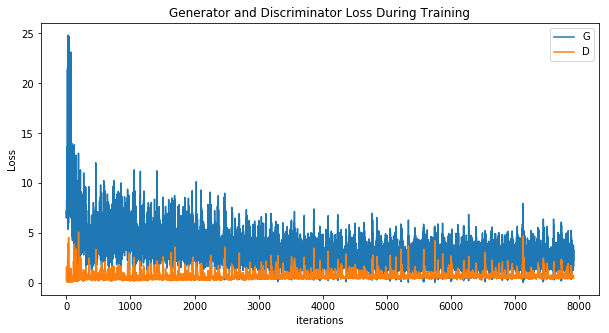

In [21]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss During Training")
plt.plot(G_losses,label="G")
plt.plot(D_losses,label="D")
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()